## TOC:
* [Setup](#first-bullet)
* [Fourier Transform Concepts in Image Processing. Concepts.](#second-bullet)
* [Magnitude](#third-bullet)
* [Phase Angle](#fourth-bullet)
* [High-Pass and Low-Pass Filters](#fifth-bullet)
* [Image Smoothing and Sharpening in the Fourier Domain](#sixth-bullet)
* [Wraparound Error and Zero-Padding](#seventh-bullet)
* [Edge Detection in the Spectral Domain](#eigth-bullet)
* [Other Applications](#tenth-bullet)
* [TLDR](#last-bullet)


## Setup <a class="anchor" id="first-bullet"></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [36]:
def read_img_rgb(img_name):
    img_rgb = cv2.cvtColor(cv2.imread(f'../L1/{img_name}'), cv2.COLOR_BGR2RGB)
    return img_rgb

def read_img_grayscale(img_name):
    img_g = cv2.cvtColor(cv2.imread(f'../L1/{img_name}'), cv2.COLOR_BGR2GRAY)
    return img_g

def apply_fft(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    return dft_shift

def apply_ifft(dft_shift):
    f_ishift = np.fft.ifftshift(dft_shift)
    img_back = cv2.idft(f_ishift)

    real_part = img_back[:, :, 1]
    img_part = img_back[:, :, 0]

    img_back = cv2.magnitude(real_part, img_part)
    return img_back

def create_gaussian_filter(shape, sigma):
    rows, cols = shape
    crow, ccol = rows // 2 , cols // 2
    x = np.linspace(-ccol, ccol, cols)
    y = np.linspace(-crow, crow, rows)
    X, Y = np.meshgrid(x, y)
    gaussian = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    return gaussian

# 1. Fourier Transform Concepts in Image Processing <a class="anchor" id="second-bullet"></a>

### a) Spatial Domain
The **spatial domain** represents an image in terms of its pixel intensities. In this domain, each pixel’s intensity value describes the brightness or color at that particular point in the image.

#### Example:
In a grayscale image, a pixel value of `0` represents black, and a value of `255` represents white, with intermediate values representing shades of gray.

#### Use-Cases:
- Image editing (brightness, contrast adjustment)
- Applying filters like blurring, sharpening, edge detection directly to pixel values.

#### Formula:
If we represent an image as a 2D matrix $ I(x, y) $, where $ x $ and $ y $ are pixel coordinates, operations in the spatial domain manipulate $ I(x, y) $ directly.

Example: a simple blur using a filter (convolution operation):
$$
I'(x, y) = \sum_{i=-k}^{k}\sum_{j=-k}^{j} I(x+i, y+j) \cdot h(i,j)
$$
Where $ h(i,j) $ is the filter kernel.

---

### b) Frequency Domain
The **frequency domain** represents an image based on its frequency content instead of pixel intensities. Applying the **Fourier Transform** converts the image from the spatial domain to the frequency domain, where the image is described in terms of its frequency components.

#### Concept:
- **Low frequencies** represent smooth variations (large areas with little detail).
- **High frequencies** represent abrupt intensity changes (edges and fine details).

#### Use-Cases:
- **Image Compression**: JPEG, for example, removes high frequencies (fine details) to reduce image size.
- **Image Filtering**: Frequency filters like low-pass filters remove high-frequency noise, while high-pass filters enhance edges.
- **Pattern Recognition**: Detecting specific shapes or patterns in an image based on frequency content.

#### Mathematical Formula (2D Discrete Fourier Transform - DFT):
Given a 2D image $ I(x, y) $, the Fourier Transform $ F(u, v) $ is computed as:
$$
F(u, v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} I(x, y) e^{-j 2\pi \left( \frac{ux}{M} + \frac{vy}{N} \right)}
$$
Where:
- $ I(x, y) $ is the image intensity at point $ (x, y) $.
- $ (u, v) $ are the frequency domain coordinates.
- $ M $ and $ N $ are the image dimensions.
- $ e^{-j 2\pi} $ is the complex exponential function.

---

### c) Magnitude and Phase
When performing a Fourier Transform, the result is complex-valued data. We extract two important components from it:
- **Magnitude**: Describes the strength of the frequency components (how much of a particular frequency is present).
- **Phase**: Describes the positional information (alignment) of those frequency components.

#### Magnitude Spectrum:
The magnitude $ |F(u,v)| $ is calculated as:
$$
|F(u, v)| = \sqrt{\text{Re}(F(u, v))^2 + \text{Im}(F(u, v))^2}
$$
Where:
- $ \text{Re}(F(u, v)) $ is the real part of the transform.
- $ \text{Im}(F(u, v)) $ is the imaginary part of the transform.

The phase $ \theta(u, v) $ is given by:
$$
\theta(u, v) = \tan^{-1} \left( \frac{\text{Im}(F(u, v))}{\text{Re}(F(u, v))} \right)
$$

#### Use-Cases:
- **Image Reconstruction**: The magnitude contains most of the visual information, while phase preserves the structure. If only the magnitude is used in reconstruction, the result is a blurred version of the image; using only the phase results in a noisy image.
- **Pattern Detection**: Magnitude helps identify dominant patterns, while phase can help in aligning patterns spatially.

---

### d) Inverse Fourier Transform
The **Inverse Fourier Transform** converts data from the frequency domain back to the spatial domain, reconstructing the original image or signal. This allows us to apply operations in the frequency domain and then return to the spatial domain to view the results.

#### Mathematical Formula:
The inverse DFT is given by:
$$
I(x, y) = \frac{1}{MN} \sum_{u=0}^{M-1} \sum_{v=0}^{N-1} F(u, v) e^{j 2\pi \left( \frac{ux}{M} + \frac{vy}{N} \right)}
$$
Where:
- $ F(u, v) $ is the frequency domain representation of the image.
- $ M $ and $ N $ are the dimensions of the image.

#### Use-Cases:
- **Revert back to spatial domain after applying transformations (edge enchacement, filters, etc.) in the spectral domain**

---

### e) Low-Frequency and High-Frequency Components
- **Low Frequencies**: Represent smooth areas in the image with little variation in intensity. They contain information about large, uniform regions (e.g., sky, smooth textures).
  
  #### Example:
  A low-pass filter removes high-frequency noise and retain only the large structures.

  #### Use-Case:
  - **Image Smoothing**

- **High Frequencies**: Represent rapid changes in the image, such as edges, texture, and fine details. These frequencies contain information about small details.

  #### Example:
  A high-pass filter enhances edges by removing low-frequency components and emphasizing the sharp transitions.

  #### Use-Case:
  - **Edge Detection**

#### Formula for Filtering:
A basic filtering operation in the frequency domain can be written as (basic multiplication):
$$
F_{\text{filtered}}(u, v) = F(u, v) \cdot H(u, v)
$$
Where:
- $ F(u, v) $ is the original frequency representation.
- $ H(u, v) $ is a filter function that emphasizes or suppresses certain frequencies.

---


In [5]:
img = read_img_grayscale('../L1/human_straight.webp')

In [30]:
# 1. Fourier Transform to Frequency/Spectral Domain
# DFT (Discrete Fourier Transform)
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)

# shifts the zero-frequency component to the center of the spectrum-image
# after applying a DFT, the low-frequency components are located in the corners of the spectrum. Using `fftshift`, we move these components to the center for better visualization.
dft_shifted = np.fft.fftshift(dft)

# dft is a 3D array. OpenCV doesn't have the notion of complex numbers, and because of that np.fft.fftshift(dft) will swap the real and complex planes
imag_part = dft_shifted[:, :, 0]
real_part = dft_shifted[:, :, 1]

# Compute the magnitude and phase
magnitude_spectrum, phase_spectrum = cv2.cartToPolar(real_part, imag_part)

# Pre-process the magnitude for visualisation purposes (usually 20 *log(magnitude) is a formula used on sound signals)
magnitude_spectrum_visualisation = 20 * np.log(magnitude_spectrum)

magnitude_unshifted = 20 * np.log(cv2.magnitude(dft[:, :, 1], dft[:, :, 0]))

# 2. Inverse Fourier Transform to go back to Spatial Domain
# Perform the inverse shift
dft_ishift = np.fft.ifftshift(dft_shift)
img_back = cv2.idft(dft_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

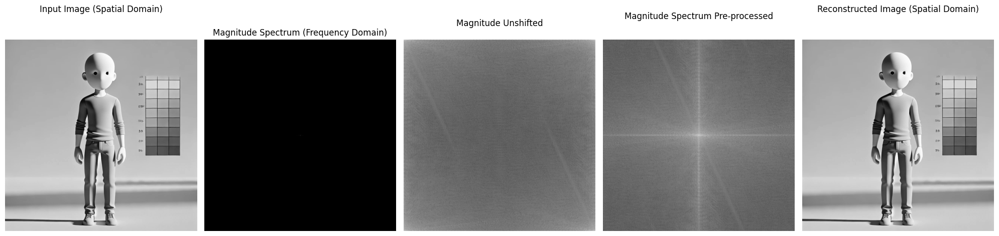

In [34]:
# Original image in the spatial domain
plt.figure(figsize=(20, 8))

plt.subplot(1, 5, 1)
plt.imshow(img, cmap='gray')
plt.title('Input Image (Spatial Domain)', pad=40)
plt.axis('off')

# Magnitude spectrum in frequency domain
plt.subplot(1, 5, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum (Frequency Domain)')
plt.axis('off')

# Magnitude spectrum in frequency domain
plt.subplot(1, 5, 3)
plt.imshow(magnitude_unshifted, cmap='gray')
plt.title('Magnitude Unshifted', pad=20)
plt.axis('off')

# Magnitude spectrum in frequency domain (pre-processed)
plt.subplot(1, 5, 4)
plt.imshow(magnitude_spectrum_visualisation, cmap='gray')
plt.title('Magnitude Spectrum Pre-processed', pad=30)
plt.axis('off')

# Reconstructed image from the inverse DFT
plt.subplot(1, 5, 5)
plt.imshow(img_back, cmap='gray')
plt.title('Reconstructed Image (Spatial Domain)', pad=40)
plt.axis('off')

plt.tight_layout()
plt.show()

### 2. Magnitude <a class="anchor" id="third-bullet"></a>
The magnitude of the Fourier Transform represents the strength or amplitude of the frequency components in the image. \
The higher the magnitude, the more significant that frequency component is.

Use-Cases:
The magnitude is often used for analyzing and visualizing the frequency content of an image, particularly in applications like image compression (e.g., JPEG) or filtering.

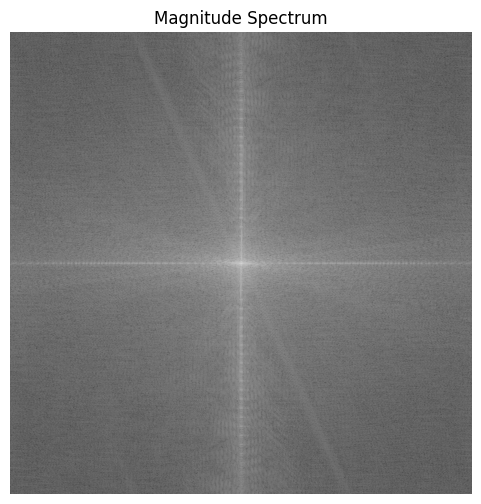

In [35]:
magnitude = cv2.magnitude(real_part, imag_part)

# Visualize the magnitude spectrum
plt.figure(figsize=(6, 6))
plt.imshow(20 * np.log(magnitude), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')
plt.show()

### 3. Phase Angle <a class="anchor" id="fourth-bullet"></a>
The phase angle contains information about the position of various frequency components in the image. The phase is crucial for reconstructing the original image after applying the inverse Fourier Transform.

Formula:

$$
\theta(u,v) = \tan^{-1} \left( \frac{\text{Im}(F(u,v))}{\text{Re}(F(u,v))} \right)
$$

Where:

- $\theta(u,v)$ is the phase angle at the frequency coordinates $(u,v)$,
- $\text{Im}(F(u,v))$ is the imaginary part of the Fourier transform at $(u,v)$,
- $\text{Re}(F(u,v))$ is the real part of the Fourier transform at $(u,v)$

**Use-Cases**:
The phase can be used in image reconstruction, alignment of frequency components, \
and in certain edge-detection techniques. \
Without the correct phase, an image cannot be reconstructed properly, even if the magnitude is preserved.

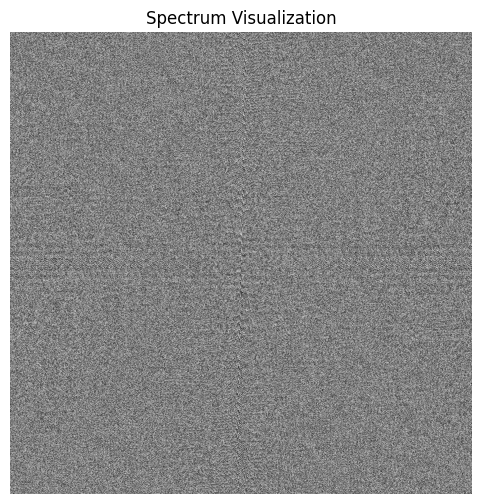

In [37]:
# Visualize the magnitude spectrum (similar to before)
plt.figure(figsize=(6, 6))
plt.imshow(phase_spectrum, cmap='gray')
plt.title('Spectrum Visualization')
plt.axis('off')
plt.show()

### 4. High-Pass and Low-Pass Filters <a class="anchor" id="fifth-bullet"></a>

In the frequency domain, high-pass filters preserve high-frequency components (edges and details), \
while low-pass filters preserve low-frequency components (broad structures).

**Use-Case**:
 - Noise Reduction: Low-pass filters can remove high-frequency noise.
 - Edge Detection: High-pass filters can emphasize sharp transitions.

## Low-Pass Filter:

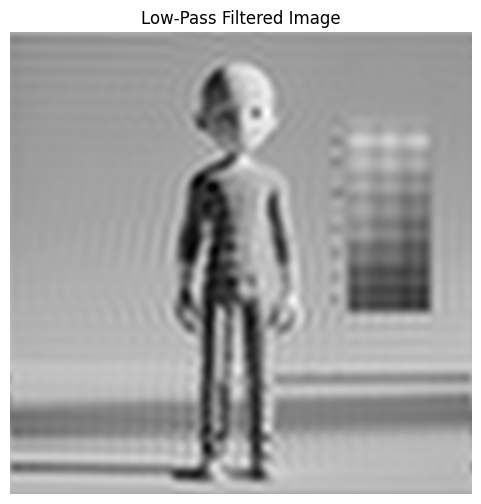

In [38]:
# Create a mask to pass low frequencies and block high frequencies
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2  # we shifted the low-frequencies to center

# Create a mask with a square low-pass region
mask = np.zeros((rows, cols, 2), np.uint8)
r = 30  # Radius of low-pass filter
mask[crow - r:crow + r, ccol - r:ccol + r] = 1

# Apply the mask to the DFT shifted spectrum
fshift_low = dft_shift * mask

# Inverse FFT to get back to the spatial domain
f_ishift = np.fft.ifftshift(fshift_low)
img_low = cv2.idft(f_ishift)
img_low = cv2.magnitude(img_low[:, :, 0], img_low[:, :, 1])

# Visualize the low-pass filtered image
plt.figure(figsize=(6, 6))
plt.imshow(img_low, cmap='gray')
plt.title('Low-Pass Filtered Image')
plt.axis('off')
plt.show()

## High-Pass Filter:

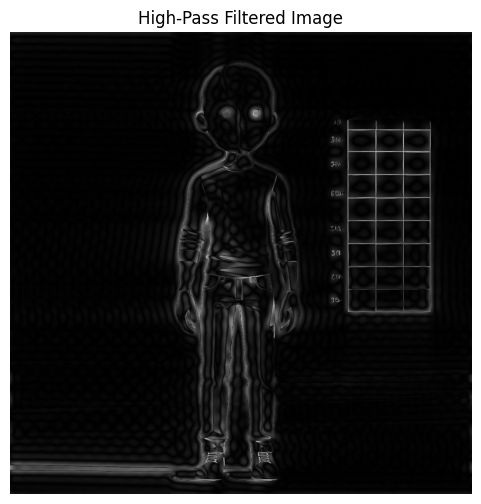

In [39]:
# Create a mask to block low frequencies and pass high frequencies
mask_high = np.ones((rows, cols, 2), np.uint8)
mask_high[crow - r:crow + r, ccol - r:ccol + r] = 0

# Apply the mask to the DFT shifted spectrum
fshift_high = dft_shift * mask_high

# Inverse FFT to get back to the spatial domain
f_ishift_high = np.fft.ifftshift(fshift_high)
img_high = cv2.idft(f_ishift_high)
img_high = cv2.magnitude(img_high[:, :, 0], img_high[:, :, 1])

# Visualize the high-pass filtered image
plt.figure(figsize=(6, 6))
plt.imshow(img_high, cmap='gray')
plt.title('High-Pass Filtered Image')
plt.axis('off')
plt.show()

### 5. Image Smoothing and Sharpening in the Fourier Domain <a class="anchor" id="sixth-bullet"></a>
Smoothing: Applying a low-pass filter smooths the image, removing fine details. \
Sharpening: Applying a high-pass filter sharpens the image by enhancing edges and high-frequency components.

### 6. Wraparound Error and Zero-Padding <a class="anchor" id="seventh-bullet"></a>
When applying a Fourier Transform to an image, the wraparound error can occur because of \
the periodic nature of the DFT. Zero-padding helps to mitigate this issue by extending the image with \
zeros, preventing artifacts at the edges.

Explanation:
 - Wraparound Error: Occurs when the high-frequency components are not aligned properly at the edges, causing visual artifacts.
 - Zero-Padding: Adding extra rows and columns filled with zeros around the image to avoid wraparound artifacts.

Reference:
https://dsp.stackexchange.com/questions/3444/why-images-need-to-be-padded-before-filtering-in-frequency-domain

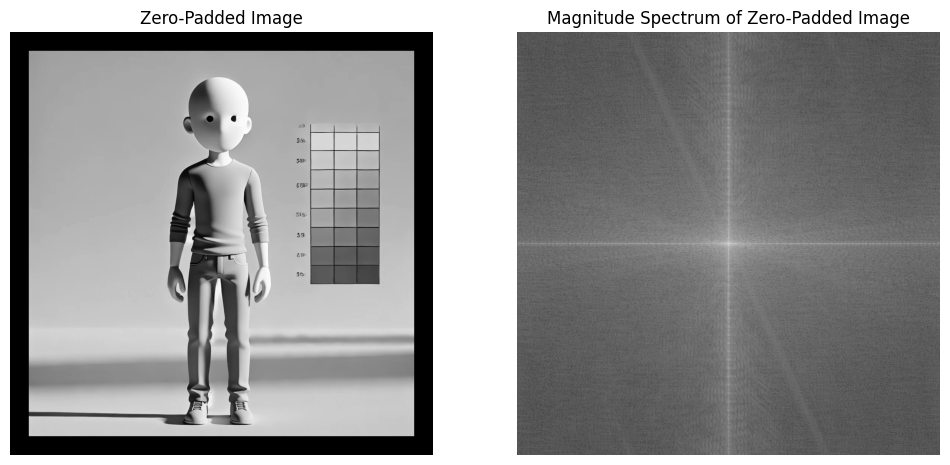

In [40]:
# Zero-pad the image
padded_img = np.pad(img, ((50, 50), (50, 50)), mode='constant')

# Perform the DFT and visualize
dft_padded = cv2.dft(np.float32(padded_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift_padded = np.fft.fftshift(dft_padded)
magnitude_padded = 20 * np.log(cv2.magnitude(dft_shift_padded[:, :, 0], dft_shift_padded[:, :, 1]))

# Visualize zero-padded image
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(padded_img, cmap='gray')
plt.title('Zero-Padded Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(magnitude_padded, cmap='gray')
plt.title('Magnitude Spectrum of Zero-Padded Image')
plt.axis('off')

plt.show()

### 7. Edge Detection in the Spectral Domain <a class="anchor" id="eigth-bullet"></a>
In the frequency domain, edges correspond to high-frequency components. \
A high-pass filter can be used to extract edges by blocking low-frequency content.

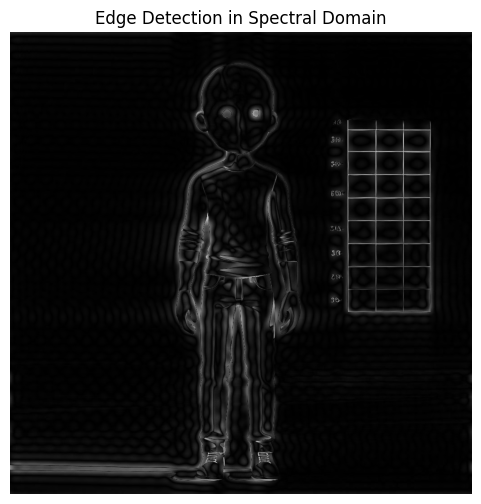

In [41]:
# Apply a high-pass filter to extract edges
fshift_edge = dft_shift * mask_high

# Inverse FFT to get the edge-detected image
f_ishift_edge = np.fft.ifftshift(fshift_edge)
img_edge = cv2.idft(f_ishift_edge)
img_edge = cv2.magnitude(img_edge[:, :, 0], img_edge[:, :, 1])

# Visualize the edge-detected image
plt.figure(figsize=(6, 6))
plt.imshow(img_edge, cmap='gray')
plt.title('Edge Detection in Spectral Domain')
plt.axis('off')
plt.show()

### 8. Image Denoising, Sharpening, and Edge Detection Using Fourier Transform <a class="anchor" id="ninth-bullet"></a>
- Load an image and add noise
- Denoising using a low-pass filter
- Sharpening using a high-pass filter
- Edge detection using the Fourier domain
- Wraparound error handling using zero-padding

In [42]:
img2 = cv2.resize(img, (512, 512))

In [44]:
# add noise

noise = np.random.normal(0, 25, img2.shape)  # Gaussian noise with mean=0 and stddev=25
noisy_img = img2 + noise
noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

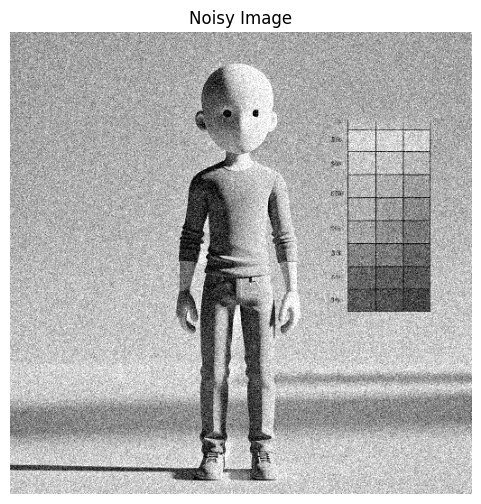

In [45]:
plt.figure(figsize=(6, 6))
plt.imshow(noisy_img, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')
plt.show()

In [46]:
# apply Fourier Transform
dft = cv2.dft(np.float32(noisy_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

In [88]:
# denoising using a Low-Pass Filter

rows, cols = noisy_img.shape
crow, ccol = rows // 2, cols // 2
mask = np.zeros((rows, cols, 2), np.uint8)
r = 50  # Radius of low-pass filter
mask[crow-r:crow+r, ccol-r:ccol+r] = 1

In [89]:
# apply the low-pass filter
fshift_low = dft_shift * mask

In [90]:
# restore image
f_ishift_low = np.fft.ifftshift(fshift_low)
img_back_low = cv2.idft(f_ishift_low)
img_back_low = cv2.magnitude(img_back_low[:, :, 1], img_back_low[:, :, 0])

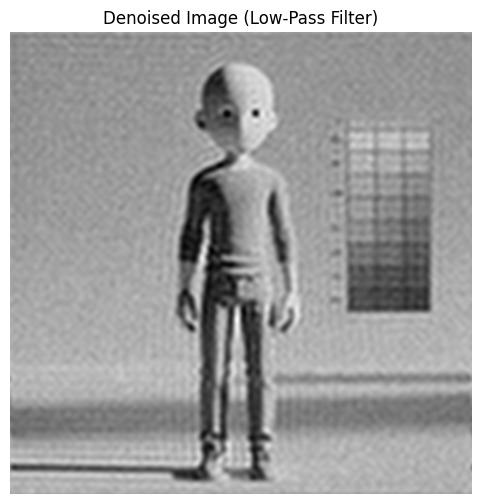

In [91]:
plt.figure(figsize=(6, 6))
plt.imshow(img_back_low, cmap='gray')
plt.title('Denoised Image (Low-Pass Filter)')
plt.axis('off')
plt.show()

In [92]:
# sharpening using a High-Pass Filter

mask_high = np.ones((rows, cols, 2), np.uint8)
mask_high[crow-r:crow+r, ccol-r:ccol+r] = 0

In [93]:
# apply the high-pass filter
fshift_high = dft_shift * mask_high

In [94]:
# recover the image
f_ishift_high = np.fft.ifftshift(fshift_high)
img_back_high = cv2.idft(f_ishift_high)
img_back_high = cv2.magnitude(img_back_high[:, :, 1], img_back_high[:, :, 0])

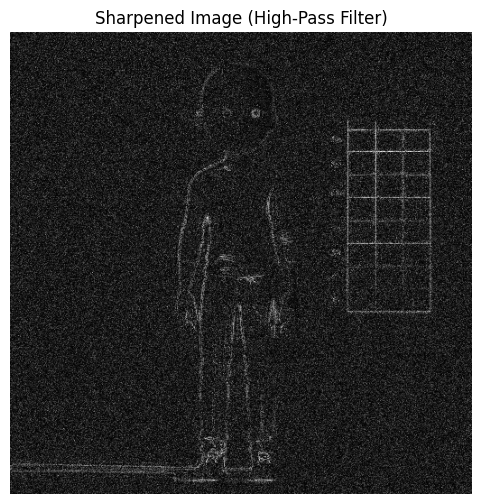

In [95]:
# Display the sharpened image
plt.figure(figsize=(6, 6))
plt.imshow(img_back_high, cmap='gray')
plt.title('Sharpened Image (High-Pass Filter)')
plt.axis('off')
plt.show()

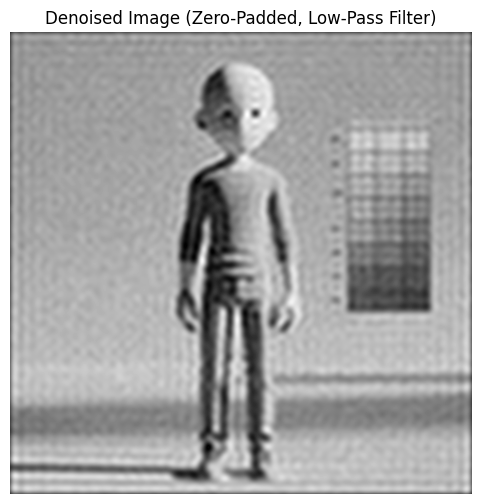

In [98]:
# handling Wraparound Error using Zero-Padding

# Zero-pad the image to prevent wraparound error
padded_img = np.pad(noisy_img, ((50, 50), (50, 50)), mode='constant')

# Perform DFT on the zero-padded image
dft_padded = cv2.dft(np.float32(padded_img), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift_padded = np.fft.fftshift(dft_padded)

# Apply the same low-pass filter to the padded image
mask_padded = np.zeros((padded_img.shape[0], padded_img.shape[1], 2), np.uint8)
crow_padded, ccol_padded = padded_img.shape[0] // 2, padded_img.shape[1] // 2
mask_padded[crow_padded-r:crow_padded+r, ccol_padded-r:ccol_padded+r] = 1

fshift_low_padded = dft_shift_padded * mask_padded

# Inverse DFT on the padded image
f_ishift_low_padded = np.fft.ifftshift(fshift_low_padded)
img_back_low_padded = cv2.idft(f_ishift_low_padded)
img_back_low_padded = cv2.magnitude(img_back_low_padded[:, :, 1], img_back_low_padded[:, :, 0])

# Crop the result back to original size
img_back_low_padded = img_back_low_padded[50:-50, 50:-50]

# Display the padded and filtered image
plt.figure(figsize=(6, 6))
plt.imshow(img_back_low_padded, cmap='gray')
plt.title('Denoised Image (Zero-Padded, Low-Pass Filter)')
plt.axis('off')
plt.show()

## Other Applications: <a class="anchor" id="tenth-bullet"></a>
* [Band-Pass Filter](#eleventh-bullet)
* [Frequency-Based Image Compression (Simulating JPEG)](#thirteenth-bullet)
* [Motion Blur Detection and Removal](#fourteenth-bullet)
* [Image Registration via Phase Correlation](#sixteenth-bullet)
* [Image Watermarking Using Fourier Transform](#seventeeth-bullet)
* [Frequency-Domain Noise Removal](#eighteenth-bullet)
* [Circular Convolution and Correlation](#nineteenth-bullet)
* [Other Applications outside CV](#twenty-oneth-bullet)


### Band-Pass Filter <a class="anchor" id="eleventh-bullet"></a>

**Concept**: A band-pass filter allows a specific range of frequencies to pass through while blocking others.

**Use-Case**: Isolating specific patterns or structures that occur in a particular frequency range.

**Example**: Apply a band-pass filter to isolate certain features in the frequency domain.


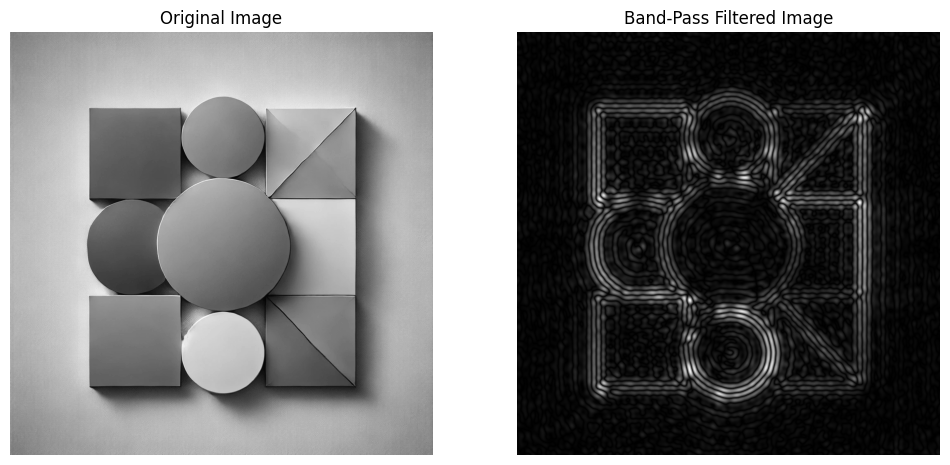

In [108]:
img3 = read_img_grayscale('../L1/geometric_shapes.webp')

# Apply DFT
dft = cv2.dft(np.float32(img3), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Create a band-pass filter mask
rows, cols = img3.shape
crow, ccol = rows // 2 , cols // 2 
low_r, high_r = 30, 60  # Define low and high radii for band-pass

mask = np.zeros((rows, cols, 2), np.uint8)
cv2.circle(mask, (ccol, crow), high_r, (1,1,1), thickness=-1)  # High radius
cv2.circle(mask, (ccol, crow), low_r, (0,0,0), thickness=-1)   # Low radius

# Apply the band-pass filter
fshift = dft_shift * mask

# Inverse DFT to recover image
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

# Display
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(img3, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(img_back, cmap='gray'), plt.title('Band-Pass Filtered Image'), plt.axis('off')
plt.show()

### Frequency-Based Image Compression (Simulating JPEG) <a class="anchor" id="thirteenth-bullet"></a>

**Concept**: JPEG compression reduces file size by removing less perceptually important high-frequency components.

**Use-Case**: Reduce image file size while maintaining visual quality.

**Example**: Apply frequency-based compression by discarding high frequencies.

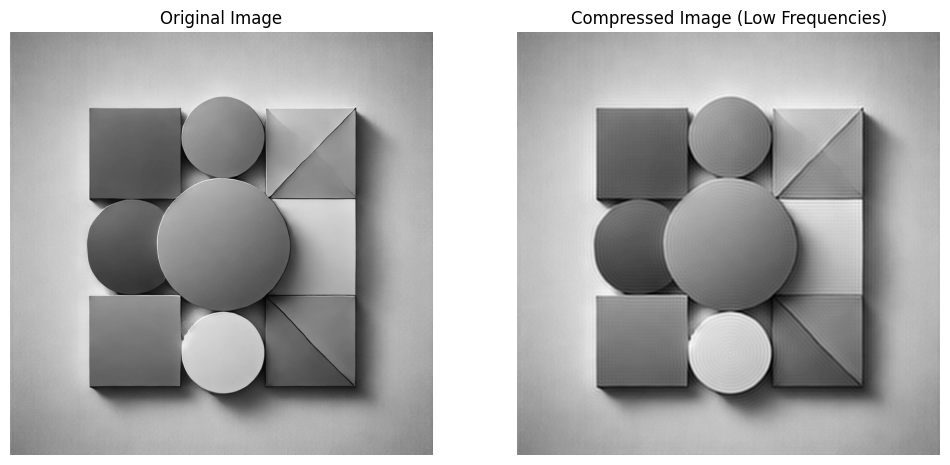

In [114]:
# Apply DFT
dft = cv2.dft(np.float32(img3), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Create a low-pass mask to simulate JPEG compression
rows, cols = img3.shape
crow, ccol = rows // 2 , cols // 2 
mask = np.zeros((rows, cols, 2), np.uint8)
r = 120  # Compression radius
cv2.circle(mask, (ccol, crow), r, (1,1,1), thickness=-1)

# Apply the mask (keeping low frequencies)
fshift = dft_shift * mask

# Inverse DFT to recover the compressed image
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

# Display
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(img3, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(122), plt.imshow(img_back, cmap='gray'), plt.title('Compressed Image (Low Frequencies)'), plt.axis('off')
plt.show()

### Motion Blur Detection and Removal <a class="anchor" id="fourteenth-bullet"></a>

**Concept**: Motion blur creates streaks in the frequency domain. These streaks can be detected and used to reverse the blur.

**Use-Case**: Restore images blurred by motion.

**Example**: Detect and remove motion blur using the Fourier Transform.

**Reference**: https://stackoverflow.com/questions/78607642/how-to-remove-motion-blur-from-a-given-image-in-frequency-domain-deconvolution

In [13]:
image = read_img_grayscale('../L3/motion_blur.webp')

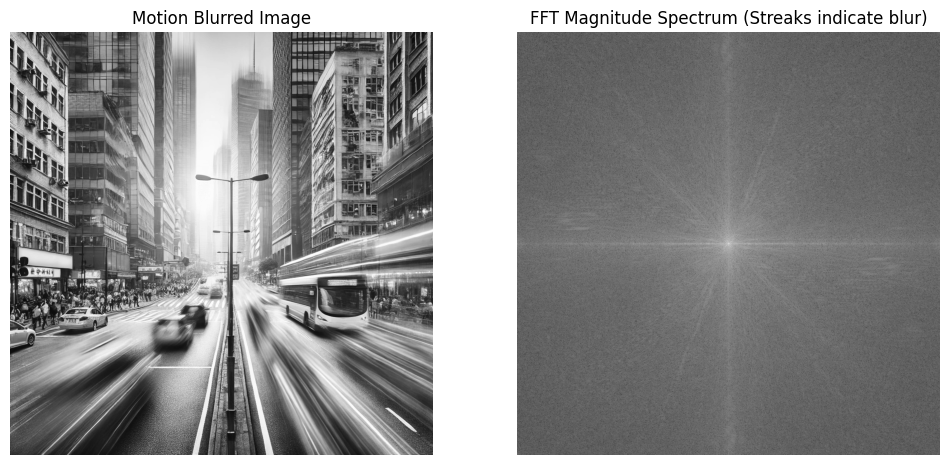

In [41]:
# Function to apply FFT and return the magnitude spectrum
def get_fft_magnitude(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)  # Shift zero frequency to center
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)
    return magnitude_spectrum, dft_shift

# Step 1: Get FFT magnitude spectrum
magnitude_spectrum, dft_shift = get_fft_magnitude(image)

# Step 2: Visualize the original image and the FFT magnitude spectrum
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(image, cmap='gray')
plt.title('Motion Blurred Image'), plt.axis('off')

plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('FFT Magnitude Spectrum (Streaks indicate blur)'), plt.axis('off')

plt.show()

# Step 3: Estimate the motion blur kernel parameters
# Here you would manually inspect the FFT magnitude spectrum
# and determine the angle and length of the streaks.
# This could also be automated by analyzing the prominent streaks programmatically.
# ......

If the blur is caused by motion in two diagonal directions that cross over, the blur kernel (PSF) would have two dominant directions, \
 and the resulting frequency domain (FFT) would show two sets of streaks forming an "X" shape in the magnitude spectrum. \
 This type of blur is more complex because it combines motion in multiple directions.

How to Handle Crossover Diagonal Motion Blur:
- Two Streaks in the Frequency Domain: You will see two sets of streaks in the FFT magnitude spectrum, each corresponding to one direction of motion.
- Separate Each Blur Component: You need to estimate the length and angle of both diagonal motions separately.
- Create a Composite Kernel: After estimating the blur components, you can combine the two motion blur kernels to create a composite blur kernel that models the motion in both directions.

Steps to Address Crossover Diagonal Motion Blur:
- Step 1: Convert the blurred image to the frequency domain using FFT.
- Step 2: Analyze the FFT magnitude spectrum to detect the two sets of streaks (representing the two directions of motion).
- Step 3: Estimate the length and angle of each blur component (i.e., for each diagonal).
- Step 4: Create two separate motion blur kernels (one for each diagonal) and combine them.
- Step 5: Use the combined kernel to apply inverse filtering and deblur the image.

In [31]:
def create_motion_blur_kernel(length, angle, shape):
    kernel = np.zeros(shape, dtype=np.float32)
    center = (shape[0] // 2, shape[1] // 2)
    rad_angle = np.deg2rad(angle)
    
    # Create a motion blur kernel in the direction of the motion
    for i in range(length):
        x = int(center[0] + i * np.cos(rad_angle))
        y = int(center[1] + i * np.sin(rad_angle))
        if 0 <= x < shape[0] and 0 <= y < shape[1]:
            kernel[x, y] = 1
    kernel /= kernel.sum()  # Normalize the kernel
    return kernel


In [32]:
image.shape

(1024, 1024)

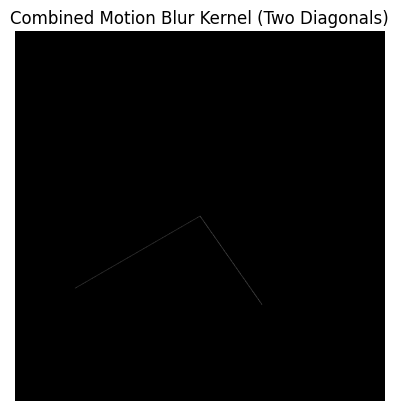

In [33]:
# Step 3: Estimate the kernel parameters for the two diagonal directions
# Manually or programmatically estimate the lengths and angles of the streaks
motion_length1 = 300  # Length of motion for the first diagonal
motion_angle1 = 35   # Angle of motion for the first diagonal

motion_length2 = 400  # Length of motion for the second diagonal
motion_angle2 = -60  # Angle of motion for the second diagonal

# Step 4: Create the two motion blur kernels for the diagonal motions
kernel_shape = (image.shape[0], image.shape[1])
motion_kernel1 = create_motion_blur_kernel(motion_length1, motion_angle1, kernel_shape)
motion_kernel2 = create_motion_blur_kernel(motion_length2, motion_angle2, kernel_shape)

# Step 5: Combine the two motion blur kernels (add them together)
combined_kernel = motion_kernel1 + motion_kernel2
combined_kernel /= combined_kernel.sum()  # Normalize the combined kernel

# Step 6: Visualize the combined motion blur kernel
plt.imshow(combined_kernel, cmap='gray')
plt.title(f"Combined Motion Blur Kernel (Two Diagonals)")
plt.axis('off')
plt.show()

In [37]:
def apply_inverse_filtering(image, kernel):
    # Step 1: FFT of the image
    dft_shift = apply_fft(image)

    # Step 2: FFT of the kernel (motion blur kernel in frequency domain)
    kernel_dft = np.fft.fftshift(cv2.dft(np.float32(kernel), flags=cv2.DFT_COMPLEX_OUTPUT))

    # Step 3: Inverse filtering (simple division in frequency domain)
    epsilon = 1e-3  # Small value to avoid division by zero
    deblurred_dft_shift = np.zeros_like(dft_shift)
    
    for i in range(2):  # For real and imaginary parts
        deblurred_dft_shift[:, :, i] = dft_shift[:, :, i] / (kernel_dft[:, :, i] + epsilon)

    # Step 4: Inverse FFT to get back the restored image
    restored_image = apply_ifft(deblurred_dft_shift)
    
    return restored_image

In [38]:
# Apply inverse filtering to deblur the image
deblurred_image = apply_inverse_filtering(image, combined_kernel)

* FFT of the Image:
    * The function apply_fft() transforms the motion-blurred image into the frequency domain using FFT. 
* FFT of the Kernel:
    * The motion blur kernel is also transformed into the frequency domain using FFT (kernel_dft). This step prepares the kernel for inverse filtering. 
* Inverse Filtering:
    * Inverse filtering is performed by dividing the FFT of the blurred image by the FFT of the motion blur kernel. A small constant (epsilon) is added to avoid division by zero. 
* Inverse FFT to Restore the Image:
    * After filtering, the result is transformed back to the spatial domain using the inverse FFT (apply_ifft()), yielding the deblurred image.

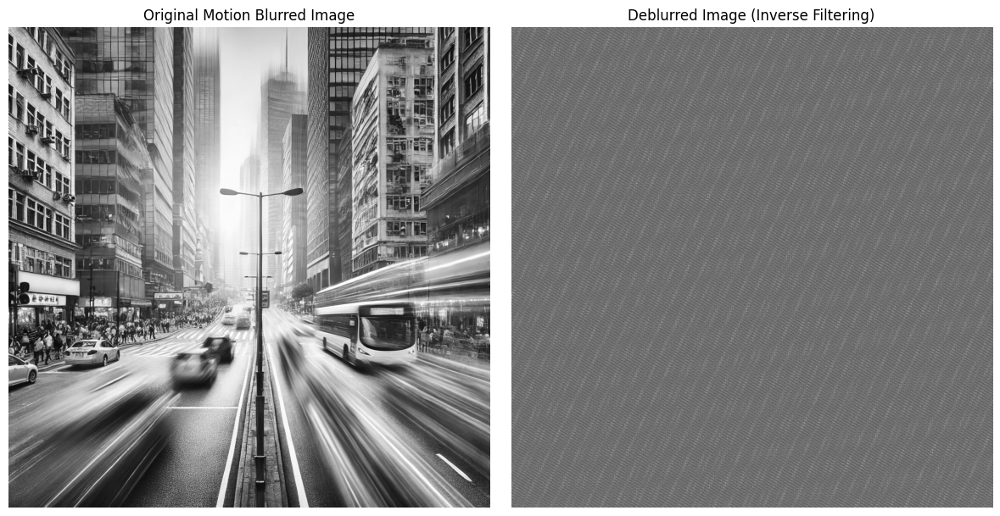

In [39]:
# Display the original and deblurred images
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Motion Blurred Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(deblurred_image, cmap='gray')
plt.title('Deblurred Image (Inverse Filtering)')
plt.axis('off')

plt.tight_layout()
plt.show()

#### Automated estimation of length and angles

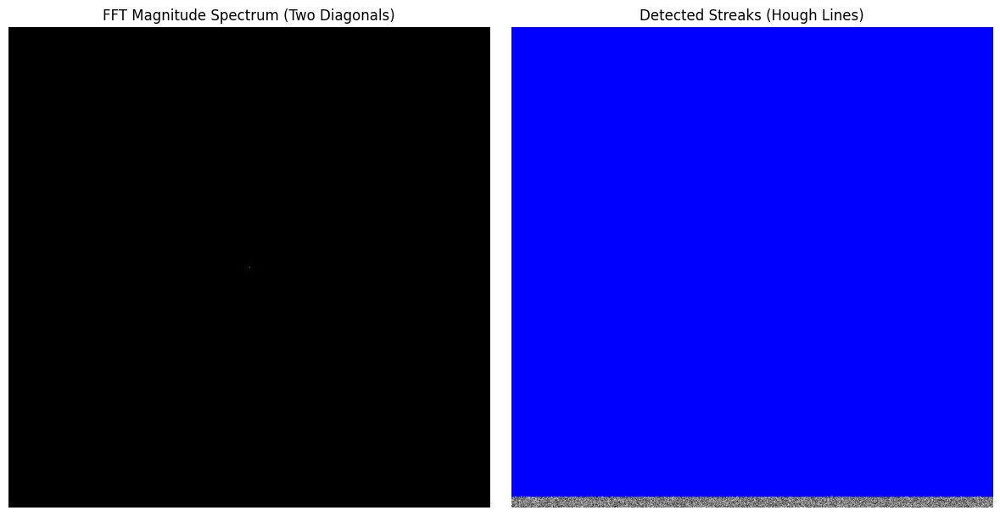

Estimated Angle: 45.00 degrees
Estimated Length: 8.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 8.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 18.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 18.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 728.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 21.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 752.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 4.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 21.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 711.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 723.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 4.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 721.00 units
Estimated Angle: -45.00 degrees
Estimated Length: 725.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 6.00 units
Estimated Angle: 45.00 degrees
Estimated Length: 6.00 units
Estimated Angle: 4

In [43]:
# Function to apply FFT and return the magnitude spectrum
def get_fft_magnitude(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)  # Shift zero frequency to center
    magnitude_spectrum = cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1
    return magnitude_spectrum

# Load the motion-blurred image (crossover diagonal motion blur)
image = read_img_grayscale('../L3/motion_blur.webp')

# Step 1: Apply FFT and get magnitude spectrum
magnitude_spectrum = get_fft_magnitude(image)

# Step 2: Apply edge detection on the magnitude spectrum (Canny Edge Detector)
edges = cv2.Canny(np.uint8(magnitude_spectrum), 50, 150, apertureSize=3)

# Step 3: Apply Hough Line Transform to detect both sets of streaks
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=100)

# Step 4: Visualize the detected lines on the FFT magnitude spectrum
plt.figure(figsize=(12, 6))

# Show original FFT magnitude spectrum
plt.subplot(121)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('FFT Magnitude Spectrum (Two Diagonals)')
plt.axis('off')

# Convert magnitude spectrum to RGB for visualization
magnitude_spectrum_rgb = cv2.cvtColor(np.uint8(magnitude_spectrum), cv2.COLOR_GRAY2BGR)

# Draw detected lines on the magnitude spectrum
if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * np.sin(theta)
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(magnitude_spectrum_rgb, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Show FFT magnitude spectrum with detected lines
plt.subplot(122)
plt.imshow(magnitude_spectrum_rgb)
plt.title('Detected Streaks (Hough Lines)')
plt.axis('off')

plt.tight_layout()
plt.show()

# Step 5: Estimate angles and lengths of motion blur for each direction
if lines is not None:
    angles = []
    lengths = []
    for line in lines:
        rho, theta = line[0]
        angle = np.degrees(theta) - 90  # Convert from radians and adjust angle
        angles.append(angle)
        print(f'Estimated Angle: {angle:.2f} degrees')

        # Estimate the length of the blur (approximate distance in frequency domain)
        blur_length = abs(rho)  # Distance from origin to line in polar coordinates
        lengths.append(blur_length)
        print(f'Estimated Length: {blur_length:.2f} units')
        
# You now have two sets of angles and lengths corresponding to the two diagonal directions.

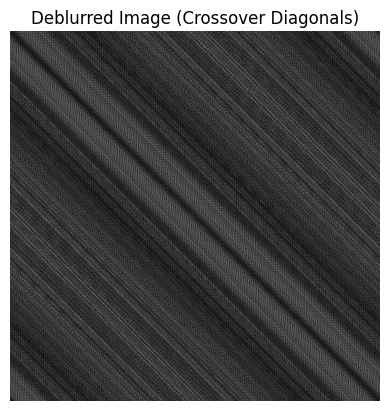

In [45]:

# Create motion blur kernel for the first diagonal
motion_kernel1 = create_motion_blur_kernel(int(lengths[0]), angles[0], image.shape)

# Create motion blur kernel for the second diagonal
motion_kernel2 = create_motion_blur_kernel(int(lengths[1]), angles[1], image.shape)

# Combine the two kernels
combined_kernel = motion_kernel1 + motion_kernel2
combined_kernel /= combined_kernel.sum()  # Normalize the combined kernel

# Apply inverse filtering with the combined kernel (as shown earlier)
deblurred_image = apply_inverse_filtering(image, combined_kernel)

# Display the deblurred image
plt.imshow(deblurred_image, cmap='gray')
plt.title('Deblurred Image (Crossover Diagonals)')
plt.axis('off')
plt.show()

### Image Registration via Phase Correlation <a class="anchor" id="sixteenth-bullet"></a>

**Concept**: Phase correlation in the frequency domain is used to align two images based on translation, rotation, and scaling.

**Use-Case**: Align two or more images taken from different perspectives or times.

**Example**: Use phase correlation to determine the translation between two images.

**Reference**: https://github.com/YoshiRi/ImRegPOC ; https://scikit-image.org/docs/stable/auto_examples/registration/plot_register_translation.html

### Image Watermarking Using Fourier Transform <a class="anchor" id="seventeeth-bullet"></a>

**Concept**: Digital watermarking embeds information into the frequency domain of an image, making it imperceptible to the human eye but recoverable.

**Use-Case**: Embed a watermark into an image to protect intellectual property.

**Example**: Apply a watermark in the Fourier domain.

### Frequency-Domain Noise Removal <a class="anchor" id="eighteenth-bullet"></a>

### Circular Convolution and Correlation <a class="anchor" id="nineteenth-bullet"></a>


**Concept**: Convolution in the spatial domain is equivalent to multiplication in the frequency domain. This allows fast convolution and correlation in the Fourier domain.

**Use-Case**: Efficient image filtering, template matching, and pattern detection.

**Example**: Perform circular convolution using the Fourier Transform.

## Other Applications outside CV: <a class="anchor" id="twenty-oneth-bullet"></a>
* [Audio](#twenty-oneth-bullet)
* [TimeSeries](#twenty-second-bullet)
* [Biosignal](#twenty-third-bullet)


### Generating a Simple Audio WAV File with Python 

### 1. Audio Processing <a class="anchor" id="twenty-oneth-bullet"></a>

#### Noise Reduction
- Concept: In the spectral domain, certain types of noise can be identified and removed. \
For example, white noise and hum (like a 60 Hz power line hum) can be isolated in the frequency domain and filtered out.

- Use-Case: Removing background noise from audio recordings, such as fan noise, electrical hum, or static.

- Example: In an audio signal, high-frequency noise can be attenuated by applying a low-pass filter, leaving the essential low-frequency components intact.

In [196]:
import wave
import struct

# Generate a sound file

sample_rate = 44100  # Sampling rate in Hz
duration = 3         # Duration in seconds
frequency = 440.0    # Frequency of the sine wave (A4 note)

# Generate the audio signal (sine wave)
t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
audio_signal = 0.5 * np.sin(2 * np.pi * frequency * t) +   # Sine wave, amplitude 0.5

# Convert the signal to 16-bit PCM format
audio_signal_int16 = np.int16(audio_signal * 32767)

# Write the audio signal to a WAV file
with wave.open('sine_wave.wav', 'w') as f:
    f.setnchannels(1)               # Mono
    f.setsampwidth(2)               # 16-bit
    f.setframerate(sample_rate)     # Sampling rate
    for sample in audio_signal_int16:
        f.writeframes(struct.pack('<h', sample))  # Write as little-endian 16-bit

SyntaxError: invalid syntax (2180149603.py, line 12)

In [166]:
import numpy as np
import scipy.io.wavfile as wavfile

# Generate a RANDOM sound file

# Parameters for the random sound
sample_rate = 44100  # Standard CD-quality sample rate
duration = 5  # seconds
num_samples = sample_rate * duration

# Generate random sound samples (values between -1 and 1)
random_sound = np.random.uniform(-1, 1, num_samples)

# Convert to 16-bit PCM format
random_sound_pcm = np.int16(random_sound * 32767)

# Save the sound as a .wav file
file_path = "random_sound.wav"
wavfile.write(file_path, sample_rate, random_sound_pcm)

print(f"Random sound saved as {file_path}")

Random sound saved as random_sound.wav


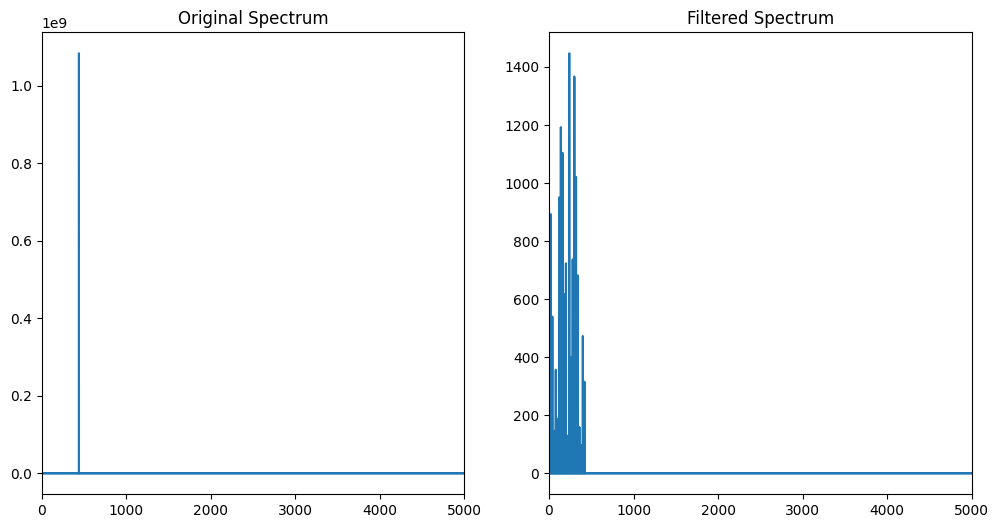

In [161]:
from scipy.io import wavfile
from scipy.fftpack import fft, ifft

# Load the noisy audio file
rate, data = wavfile.read('sine_wave.wav')

# Perform Fourier Transform
data_fft = fft(data)

# Frequency components
freq = np.fft.fftfreq(len(data), 1/rate)

# Apply a low-pass filter by zeroing out high frequencies
threshold = 439  # Frequency threshold (in Hz)
data_fft_filtered = np.where(abs(freq) > threshold, 0, data_fft)

# Perform inverse Fourier Transform
filtered_data = np.real(ifft(data_fft_filtered))

# Save the filtered audio
wavfile.write('filtered_audio.wav', rate, np.int16(filtered_data))

# Visualize original vs filtered spectrum
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.plot(freq, np.abs(data_fft)), plt.title('Original Spectrum'), plt.xlim([0, 5000])
plt.subplot(122), plt.plot(freq, np.abs(data_fft_filtered)), plt.title('Filtered Spectrum'), plt.xlim([0, 5000])
plt.show()

#### Spectrogram Analysis
Concept: A spectrogram is a visual representation of the spectrum of frequencies in a signal as it varies with time. It's useful for analyzing the evolution of sounds.

Use-Case: Spectrograms are widely used in speech processing (e.g., speech-to-text systems), music analysis, and animal vocalization studies (e.g., birdsong analysis).

C:\Users\Gus\AppData\Local\Temp\ipykernel_41792\2678503923.py:13: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')


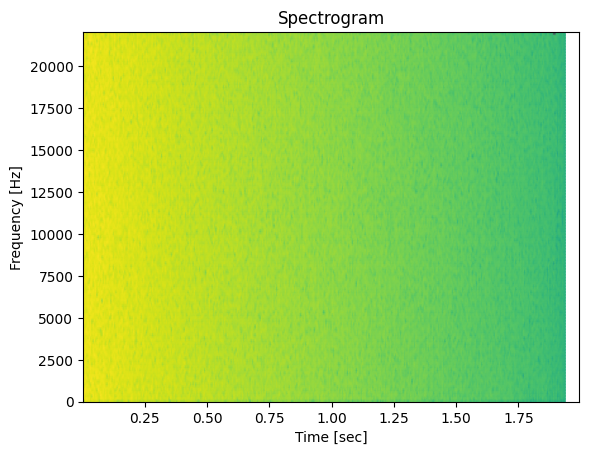

In [168]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile
from scipy.signal import spectrogram

# Load audio file
rate, data = wavfile.read('dog_bark.wav')

# Compute spectrogram
f, t, Sxx = spectrogram(data, rate)

# Display the spectrogram
plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('Spectrogram')
plt.show()

### 2. Time Series Analysis <a class="anchor" id="twenty-second-bullet"></a>

#### Anomaly Detection
 - Concept: Sudden changes or anomalies in a time series signal can manifest as high-frequency components in the spectral domain. Detecting these high-frequency spikes can help identify anomalies in the data.

 - Use-Case: Identifying fraudulent transactions, detecting equipment failures from sensor data, or spotting unusual market behavior.

### 3. Biomedical Signal Processing <a class="anchor" id="twenty-third-bullet"></a>

* Electrocardiogram (ECG) Analysis
    * Heart Rate Variability (HRV) Analysis
* EEG Brainwave Analysis
    * Sleep Stage Detection
    * Seizure Detection


#### Seizure Detection in EEG Signals

In [173]:
from scipy.signal import spectrogram

# Simulated EEG data: normal brain activity mixed with seizure activity
# Normal EEG frequencies: 0.5-40 Hz; seizure activity (spike): high-frequency oscillation starting at second 5
np.random.seed(0)
t = np.linspace(0, 10, 5000)
normal_activity = np.sin(2 * np.pi * 10 * t) + 0.5 * np.sin(2 * np.pi * 20 * t)
seizure_activity = 2 * np.sin(2 * np.pi * 100 * t) * (t > 5)  # Seizure starts after 5 seconds
eeg_signal = normal_activity + seizure_activity + 0.3 * np.random.randn(len(t))

# Perform a spectrogram to analyze the time-frequency representation
frequencies, times, Sxx = spectrogram(eeg_signal, fs=500)

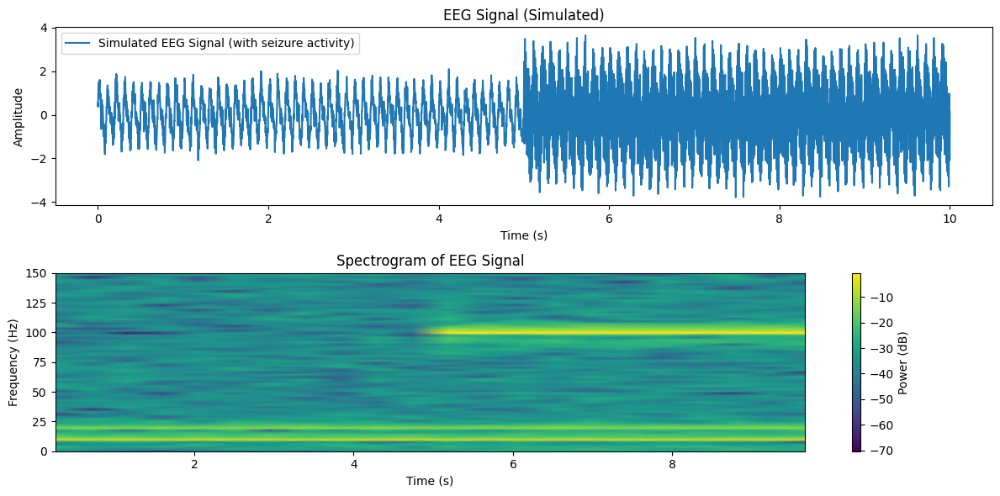

In [172]:
plt.figure(figsize=(12, 6))

plt.subplot(211)
plt.plot(t, eeg_signal, label="Simulated EEG Signal (with seizure activity)")
plt.title('EEG Signal (Simulated)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()

plt.subplot(212)
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
plt.title('Spectrogram of EEG Signal')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.ylim([0, 150])
plt.colorbar(label='Power (dB)')
plt.tight_layout()
plt.show()

Explanation:
- Simulated EEG Data: Normal brain activity (low frequency) combined with seizure-like activity (high-frequency spike starting at 5 seconds).
- Spectrogram: Used to visualize how the frequency content of the EEG signal changes over time. Seizures manifest as a high-frequency burst in the spectrogram (starting at 5 seconds in this example).

#### Heart Rate Variability (HRV) Analysis

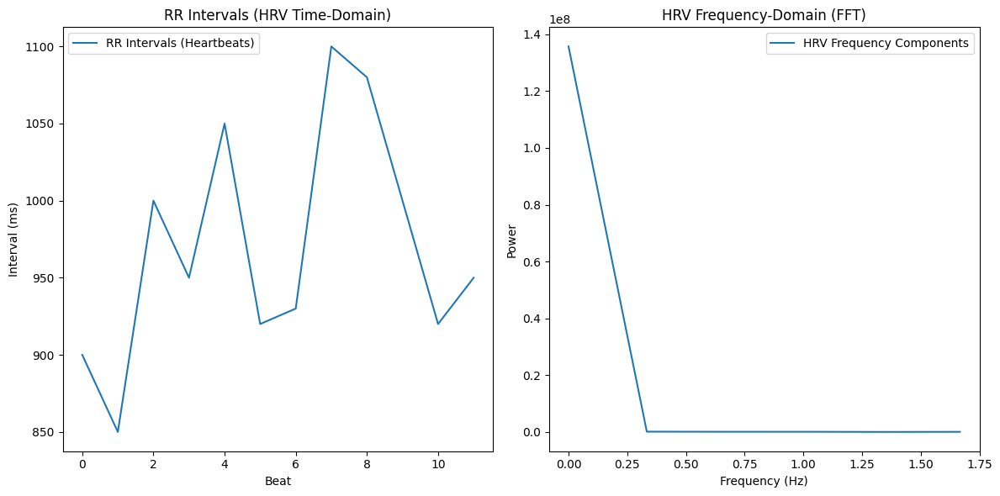

In [175]:
from scipy.fftpack import fftfreq

# Simulated RR intervals (time between heartbeats) in milliseconds
rr_intervals = np.array([900, 850, 1000, 950, 1050, 920, 930, 1100, 1080, 1000, 920, 950])  # Example RR intervals
fs = 4  # Sampling frequency in Hz (4 samples per second, assuming RR intervals are over seconds)

# Perform Fourier Transform on the RR intervals to analyze frequency content
rr_fft = fft(rr_intervals)
frequencies = fftfreq(len(rr_intervals), d=1/fs)

# Power spectral density
psd = np.abs(rr_fft)**2

# Plot the HRV time-domain and frequency-domain
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.plot(rr_intervals, label="RR Intervals (Heartbeats)")
plt.title('RR Intervals (HRV Time-Domain)')
plt.xlabel('Beat')
plt.ylabel('Interval (ms)')
plt.legend()

plt.subplot(122)
plt.plot(frequencies[:len(frequencies)//2], psd[:len(frequencies)//2], label="HRV Frequency Components")
plt.title('HRV Frequency-Domain (FFT)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.legend()
plt.tight_layout()
plt.show()

Explanation:
- RR Intervals: The time between consecutive heartbeats is analyzed in both the time and frequency domains.
- Fourier Transform: The FFT is applied to analyze the frequency components of HRV. Low-frequency (LF) components are associated with sympathetic nervous system activity, while high-frequency (HF) components correspond to parasympathetic activity.

#### Sleep Stage Detection from EEG Signals

#### Concept: Sleep can be broken down into stages, each characterized by different EEG frequency bands. For example:

- Delta waves (0.5-4 Hz) dominate during deep sleep.
- Theta waves (4-8 Hz) are prominent during light sleep.
- Alpha waves (8-12 Hz) are observed during relaxed wakefulness.

Use-Case: Detect sleep stages based on EEG data by analyzing the dominant frequency bands.

In [195]:
from scipy.signal import butter, filtfilt

# Simulated EEG signal with different sleep stages (Delta, Theta, Alpha waves)
t = np.linspace(0, 60, 1000)  # Simulated 1-minute EEG signal
delta_waves = np.sin(2 * np.pi * 2 * t)  # Delta waves (deep sleep)
theta_waves = np.sin(2 * np.pi * 6 * t)  # Theta waves (light sleep)
alpha_waves = np.sin(2 * np.pi * 10 * t)  # Alpha waves (wakefulness)

# EEG signal transitions between different sleep stages
eeg_signal = np.concatenate([
    delta_waves[:300],    # Delta (first 20 seconds)
    theta_waves[300:600], # Theta (next 20 seconds)
    alpha_waves[600:],    # Alpha (final 20 seconds)
])

# Bandpass filters for Delta, Theta, and Alpha waves
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    print([low, high, nyquist])
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)

fs = 1000 / 60  # Sampling frequency (1 Hz for simplicity)

# Filter the EEG signal to extract Delta, Theta, and Alpha waves
delta_filtered = bandpass_filter(eeg_signal, 0.5, 4, fs)
theta_filtered = bandpass_filter(eeg_signal, 4, 8, fs)
alpha_filtered = bandpass_filter(eeg_signal, 6, 8, fs)

[0.06, 0.48, 8.333333333333334]
[0.48, 0.96, 8.333333333333334]
[0.72, 0.96, 8.333333333333334]


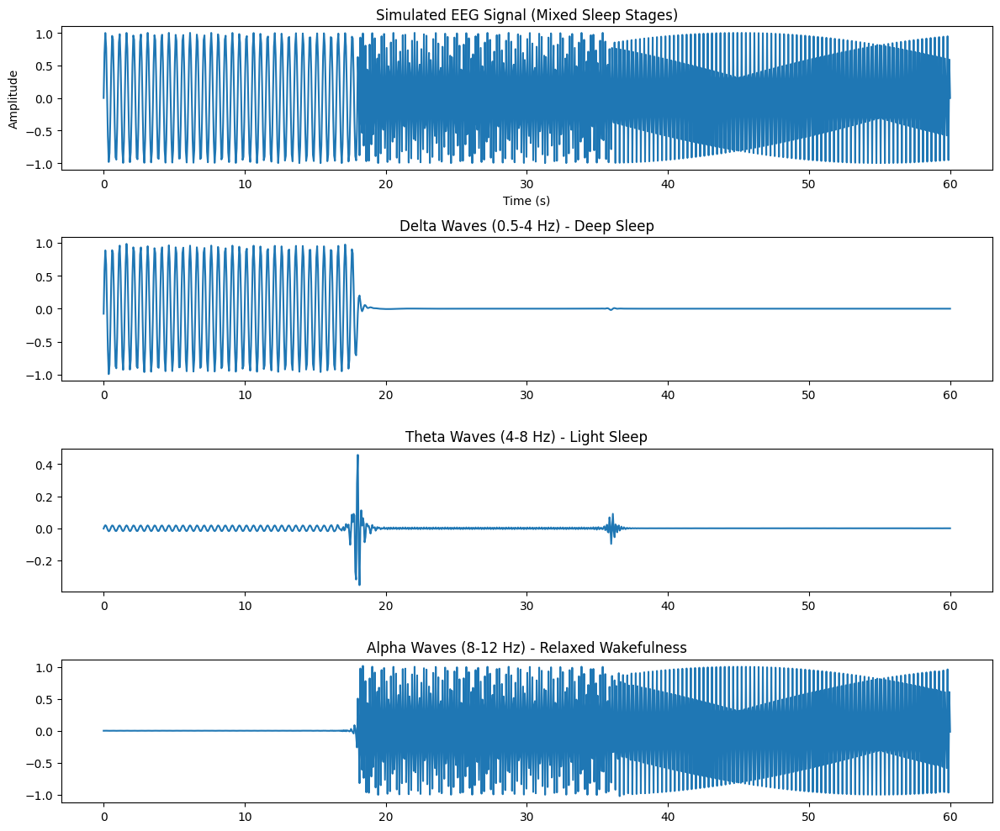

In [194]:
plt.figure(figsize=(12, 10))

plt.subplot(411)
plt.plot(t, eeg_signal)
plt.title('Simulated EEG Signal (Mixed Sleep Stages)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.subplot(412)
plt.plot(t, delta_filtered)
plt.title('Delta Waves (0.5-4 Hz) - Deep Sleep')

plt.subplot(413)
plt.plot(t, theta_filtered)
plt.title('Theta Waves (4-8 Hz) - Light Sleep')

plt.subplot(414)
plt.plot(t, alpha_filtered)
plt.title('Alpha Waves (8-12 Hz) - Relaxed Wakefulness')

plt.tight_layout()
plt.show()

Explanation:

- Simulated EEG Data: The signal transitions through different sleep stages with delta, theta, and alpha waves.
- Bandpass Filters: Each frequency band is isolated using a bandpass filter, corresponding to different sleep stages.
- Result: You can see how different stages of sleep (deep, light, and wakefulness) are characterized by different dominant frequency components in the EEG.